# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [5]:
proj_name = "simulation_cluster_paramtest"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

mps


'Jan14-1142'

In [6]:
state_key = 'cluster'
batch_key = 'batch'
state_type = 'cluster'
batch_type = 'batch_specific_features'
distribution = 'normal'
n_cells = [200,100,100,50,30]
n_genes = [100,100,50,30,20]
state_dispersion = [5.0,4.0,4.0,3.0,2.0]
batch_dispersion = [3.0, 3.0]
pairwise_non_specific_gene_fraction={
                     (0,1):0.7, (0,2):0.0, (0,3):0.0, (0,4):0.0, 
                     (1,2):0.0, (1,3):0.0, (1,4):0.0, 
                     (2,3):0.4, (2,4):0.0,
                     (3,4):0.0
                 }

In [7]:
from Concord.utils.simulation import Simulation

# Create an instance of the Simulation class

sim = Simulation(n_cells=n_cells, n_genes=n_genes,
                 n_batches=2, n_states=5, 
                 state_type=state_type, 
                 state_distribution = distribution, 
                 state_level=5, 
                 state_min_level=0,
                 state_dispersion=state_dispersion, 
                 program_structure="uniform",
                 program_on_time_fraction=0.3,
                 trajectory_program_num=4,
                 trajectory_loop_to=[1],
                 batch_feature_frac=0.15,
                 batch_distribution = distribution,
                 batch_type=batch_type, 
                 batch_level=[5,5], 
                 batch_dispersion=batch_dispersion, 
                 global_non_specific_gene_fraction=0.1,
                 pairwise_non_specific_gene_fraction=pairwise_non_specific_gene_fraction,
                 non_neg=True, to_int=True,
                 seed=seed)

# Generate the simulated data
adata_state = sim.simulate_state()
adata_state = adata_state[:, ccd.ul.sort_string_list(adata_state.var_names)]
adata_state.shape

Concord.utils.simulation - INFO - Simulating 5 clusters with distribution: normal with mean expression 5 and dispersion [5.0, 4.0, 4.0, 3.0, 2.0].
Concord.utils.simulation - INFO - Adding non-specific genes to the expression matrix. Note this will increase gene count compared to the specified value.
Concord.utils.simulation - INFO - Adding non-specific genes to the expression matrix. Note this will increase gene count compared to the specified value.


(480, 300)

In [8]:
# Define cell indices for each batch, with partial overlap
batch1_clusters = ['cluster_'+str(i) for i in [1,2,3]]
batch2_clusters = ['cluster_'+str(i) for i in [3,4,5]]

batch_cell_proportion = 0.3
batch_cell_count = int(adata_state.n_obs * batch_cell_proportion)
batch1_idx = np.random.choice(adata_state.obs.query(f"{state_key} in {batch1_clusters}").index, batch_cell_count, replace=False)
batch2_idx = np.random.choice(adata_state.obs.query(f"{state_key} in {batch2_clusters}").index, batch_cell_count, replace=False)

batch_indices = {0:ccd.ul.sort_string_list(batch1_idx), 1:ccd.ul.sort_string_list(batch2_idx)}

In [9]:
from scipy import sparse as sp
import anndata as ad

batch_list = []
state_list = []
for i in range(sim.n_batches):
    batch_adata, batch_adata_pre = sim.simulate_batch(
        adata_state, 
        cell_proportion=sim.batch_cell_proportion[i], 
        cell_indices=batch_indices[i],
        batch_name=f"batch_{i+1}", effect_type=sim.batch_type[i], 
        distribution = sim.batch_distribution[i],
        level=sim.batch_level[i], dispersion=sim.batch_dispersion[i], 
        batch_feature_frac=sim.batch_feature_frac[i], seed=sim.seed+i)
    batch_list.append(batch_adata)
    state_list.append(batch_adata_pre)

adata = ad.concat(batch_list, join='outer')
adata.X = adata.X.toarray() if sp.issparse(adata.X) else adata.X
adata.X = np.nan_to_num(adata.X, nan=0.0)

adata = adata[:, ccd.ul.sort_string_list(adata.var_names)]

adata_pre = ad.concat(state_list, join='outer')
adata_pre = adata_pre[:, ccd.ul.sort_string_list(adata_pre.var_names)]

# Concatenate batch name to cell names to make them unique
adata.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata.obs['batch'], adata.obs_names)]
adata_pre.obs_names = [f"{batch}_{cell}" for batch, cell in zip(adata_pre.obs['batch'], adata_pre.obs_names)]

adata.obs['batch'] = adata.obs['batch'].astype('category')
adata_pre.obs['batch'] = adata_pre.obs['batch'].astype('category')

if sim.non_neg:
    adata.X[adata.X < 0] = 0
    adata_pre.X[adata_pre.X < 0] = 0
if sim.to_int:
    adata.X = adata.X.astype(int)
    adata_pre.X = adata_pre.X.astype(int)

adata.layers['wt_noise'] = adata.X 
adata_pre.layers['wt_noise'] = adata_pre.X
adata.layers['counts'] = adata.X.copy()

adata_state = adata_pre


Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_1 by appending a set of batch-specific genes with normal distributed value with level 5 and dispersion 3.0.
Concord.utils.simulation - INFO - Simulating batch-specific features effect on batch_2 by appending a set of batch-specific genes with normal distributed value with level 5 and dispersion 3.0.


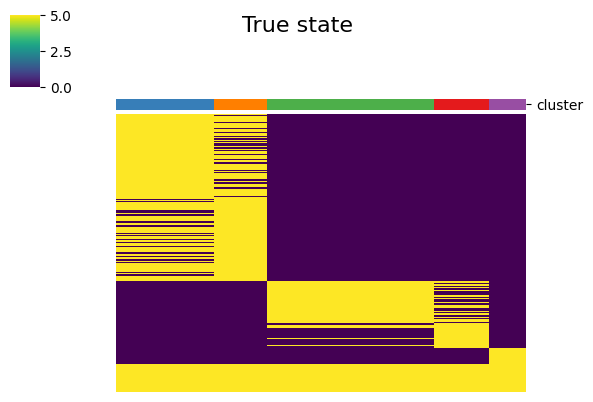

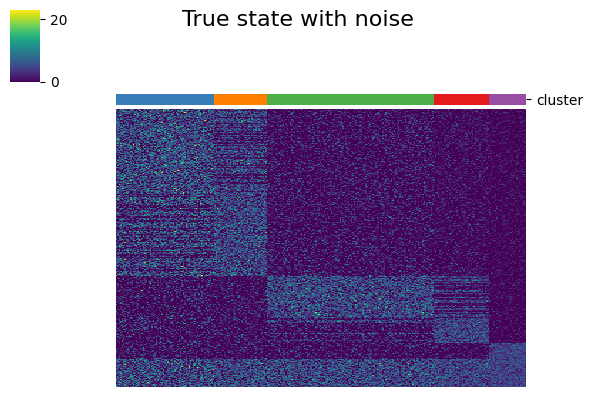

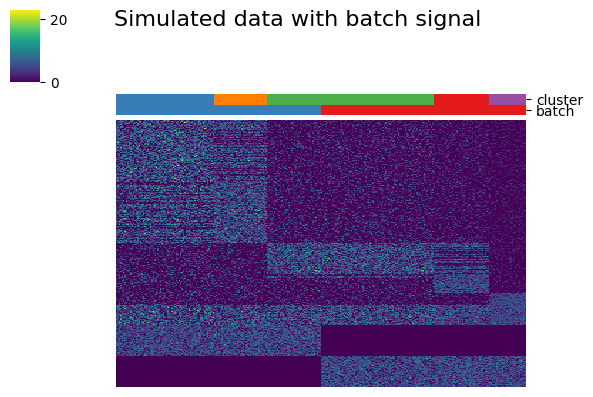

In [10]:
ccd.pl.heatmap_with_annotations(adata_state, val='no_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state', save_path=save_dir/f'true_state_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata_state, val='wt_noise', obs_keys=[state_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='True state with noise', save_path=save_dir/f'true_state_with_noise_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Simulated data with batch signal', save_path=save_dir/f'simulated_data_heatmap_{file_suffix}.png', figsize=(6, 4), dpi=300)

### No batch effect, no noise

In [11]:
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_no_noise', result_key='UMAP_no_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_no_noise']


### NO batch effect, noise added, PCA and UMAP

In [12]:
adata_state.X = adata_state.layers['wt_noise'].copy()
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=30, random_state=seed)
ccd.ul.run_umap(adata_state, source_key='PCA_wt_noise', result_key='UMAP_wt_noise', random_state=seed)

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']
Concord - INFO - UMAP embedding stored in adata.obsm['UMAP_wt_noise']


### No batch correction, PCA and UMAP

In [13]:
n_pcs = min(adata.n_obs, adata.n_vars)-1
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.5)
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

### Concord

In [26]:
concord_args = {
        'adata': adata,
        'domain_key': batch_key,
        'verbose': True,
        'inplace': True,
        'use_faiss': False,
        'seed': seed,
        'device': device,
        'save_dir': save_dir
    }

In [27]:
  batch_size=32,
  n_epochs=10,
  latent_dim=32, # latent dimension
  min_p_intra_domain = .95
  augmentation_mask_prob = 0.5, # augmentation mask probability, recommend between 0.1 and 0.7
  p_intra_domain = 1.0, # probability of intra-domain sampling
  p_intra_knn=0.3,
  clr_temperature = 0.5, # temperature for NT-Xent loss
  sampler_knn = 30

In [29]:
cur_ccd = ccd.Concord(use_decoder=False, **concord_args)

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - INFO - Setting sampler_knn to 5 to be 1/50 the number of cells in the dataset. You can change this value by setting sampler_knn in the configuration.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - INFO - Proceeding with all 390 features in the dataset.
Concord - INFO - Column 'batch' is now of type: category
Concord - INFO - Encoder input dim: 390
Concord - INFO - Model loaded to device: mps
Concord - INFO - Total number of parameters: 54512
Concord.model.anndataset - INFO - Initialized dataset with 288 samples. Data structure: ['input', 'domain', 'idx']
Concord.model.dataloader - INFO - Number of unique_domains: 2
Concord.model.dataloader - INFO - Calculating each domain's coverage of the global manifold using X_pca.
Concord.model.dataloader - INFO - Converting coverage {'batch_1': 0.5902777777777778, 'batch_2': 0.5902777777777778} to p_intra_domain...
Concord.model.da

Epoch 0 Training: 4it [00:00, 45.52it/s, loss=4.44]

Concord - INFO - Epoch   0 | Train Loss: 4.47, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.47, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/10
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 1 Training: 100%|██████████| 4/4 [00:00<00:00, 47.22it/s, loss=4.36]

Concord - INFO - Epoch   1 | Train Loss: 4.36, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.36, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/10
Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 2 Training: 100%|██████████| 4/4 [00:00<00:00, 46.02it/s, loss=4.15]

Concord - INFO - Epoch   2 | Train Loss: 4.23, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.23, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 4/10
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 3 Training: 100%|██████████| 4/4 [00:00<00:00, 51.02it/s, loss=4.11]

Concord - INFO - Epoch   3 | Train Loss: 4.13, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.13, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 5/10
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 4 Training: 100%|██████████| 4/4 [00:00<00:00, 49.12it/s, loss=4.07]

Concord - INFO - Epoch   4 | Train Loss: 4.09, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.09, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 6/10
Concord - INFO - Processing chunk 1/1 for epoch 6
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 5 Training: 100%|██████████| 4/4 [00:00<00:00, 52.73it/s, loss=4.16]

Concord - INFO - Epoch   5 | Train Loss: 4.10, MSE: 0.00, CLASS: 0.00, CONTRAST: 4.10, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 7/10
Concord - INFO - Processing chunk 1/1 for epoch 7
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 6 Training: 100%|██████████| 4/4 [00:00<00:00, 49.23it/s, loss=3.96]

Concord - INFO - Epoch   6 | Train Loss: 3.99, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.99, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 8/10
Concord - INFO - Processing chunk 1/1 for epoch 8
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 7 Training: 100%|██████████| 4/4 [00:00<00:00, 51.25it/s, loss=4.01]

Concord - INFO - Epoch   7 | Train Loss: 3.98, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.98, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 9/10
Concord - INFO - Processing chunk 1/1 for epoch 9
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 8 Training: 100%|██████████| 4/4 [00:00<00:00, 49.02it/s, loss=3.96]

Concord - INFO - Epoch   8 | Train Loss: 3.90, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.90, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 10/10
Concord - INFO - Processing chunk 1/1 for epoch 10
Concord - INFO - Number of samples in train_dataloader: 288



Epoch 9 Training: 100%|██████████| 4/4 [00:00<00:00, 46.28it/s, loss=3.87]

Concord - INFO - Epoch   9 | Train Loss: 3.89, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.89, IMPORTANCE: 0.00
Concord - INFO - Model saved to ../save/dev_simulation_cluster_paramtest-Jan14/final_model_Jan14-1154.pt
Concord - INFO - Final model saved at: ../save/dev_simulation_cluster_paramtest-Jan14/final_model_Jan14-1154.pt; Configuration saved at: ../save/dev_simulation_cluster_paramtest-Jan14/config_Jan14-1154.json.
Concord.model.anndataset - INFO - Initialized dataset with 288 samples. Data structure: ['input', 'domain', 'idx']
Concord - INFO - Predicting for chunk 1/1


Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP_2D']


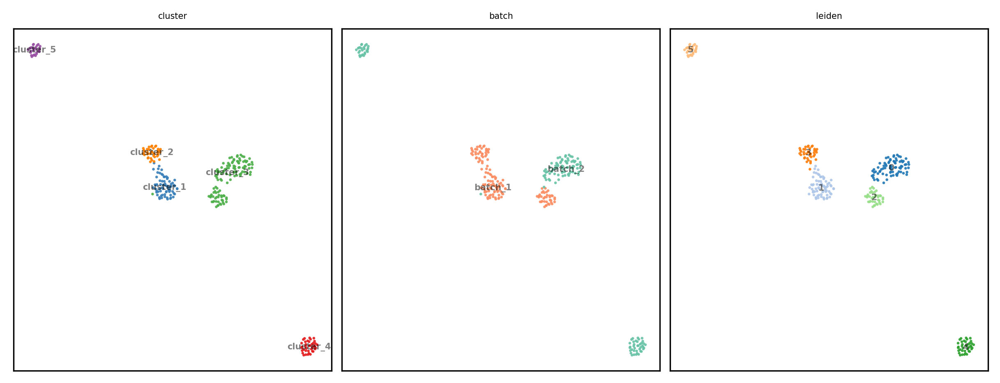

In [33]:
sc.pp.neighbors(adata, n_neighbors=30, use_rep = 'Concord')
ccd.ul.run_umap(adata, source_key='Concord', result_key='Concord_UMAP_2D', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
sc.tl.leiden(adata, resolution=1.0)
show_cols = [state_key, batch_key, 'leiden']
show_basis = 'Concord_UMAP_2D'   
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    pal = {'cluster':'Set1', 'batch':'Set2', 'leiden':'tab20'},
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)


In [60]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad") 
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")

# Run other methods

In [21]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
ccd.set_verbose_mode(True)
show_cols = [state_key, batch_key]
timer = ccd.ul.Timer()
time_log = {}

### Scanorama

In [63]:
output_key = 'Scanorama'

with timer:
    ccd.ul.run_scanorama(adata, batch_key="batch", output_key=output_key, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

Found 390 genes among all datasets
[[0.         0.59027778]
 [0.         0.        ]]
Processing datasets (0, 1)
Found 390 genes among all datasets
[[0.         0.59027778]
 [0.         0.        ]]
Processing datasets (0, 1)


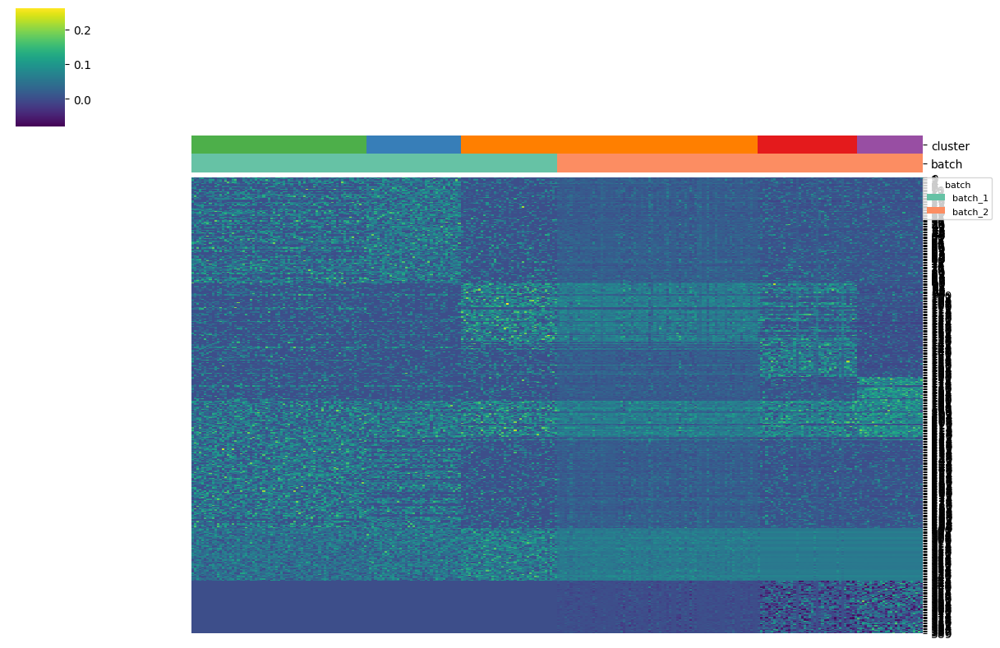

In [64]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Scanorama_UMAP']


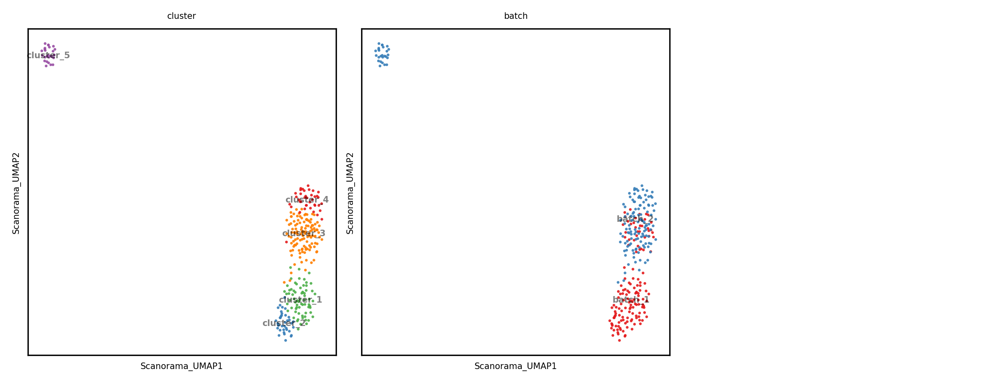

In [65]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Liger

In [66]:
output_key = 'Liger'
adata.layers["counts"] = adata.X.copy()
with timer:
    ccd.ul.run_liger(adata, batch_key="batch", count_layer="counts", output_key=output_key, k=30, return_corrected=True)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

100%|██████████| 30/30 [00:04<00:00,  6.20it/s]


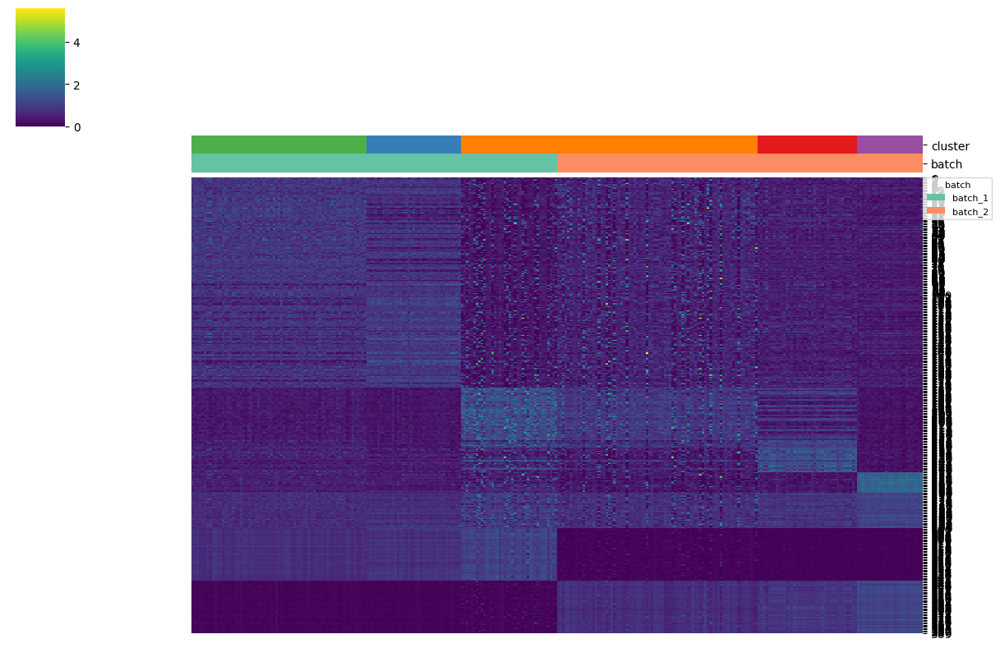

In [67]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['Liger_UMAP']


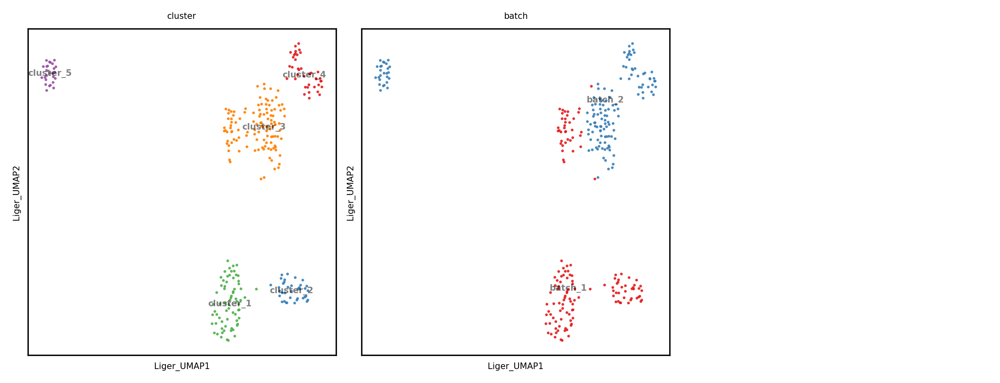

In [68]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Harmony

In [69]:
output_key = 'Harmony'
with timer:
    ccd.ul.run_harmony(adata, batch_key="batch", input_key='X_pca', output_key=output_key)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


Concord - INFO - UMAP embedding stored in adata.obsm['Harmony_UMAP']


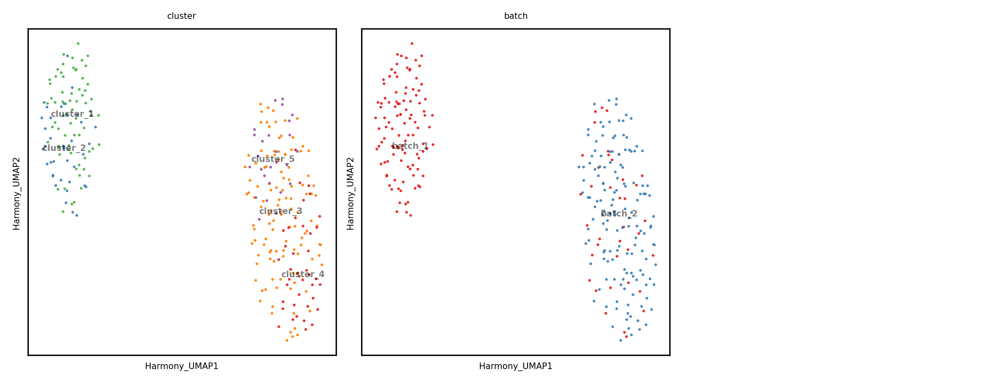

In [70]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scVI

In [71]:
output_key = 'scVI'
transform_batch = 'batch_1'
with timer:
    scvi_vae = ccd.ul.run_scvi(adata, batch_key="batch", output_key=output_key, return_model=True, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 400/400: 100%|██████████| 400/400 [00:20<00:00, 23.11it/s, v_num=1, train_loss_step=742, train_loss_epoch=715]    

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:20<00:00, 19.68it/s, v_num=1, train_loss_step=742, train_loss_epoch=715]


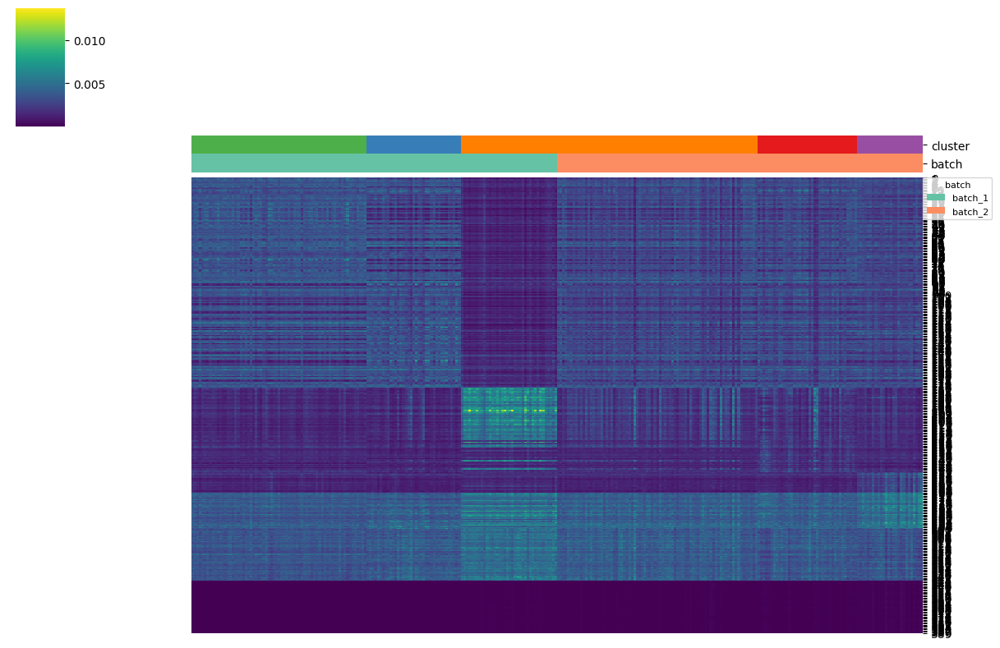

In [72]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scVI_UMAP']


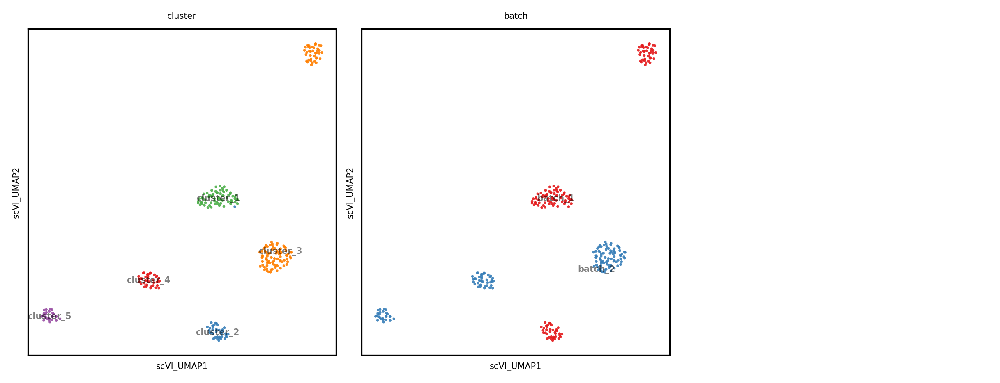

In [73]:
output_key = 'scVI'
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### scANVI

In [75]:
output_key = 'scANVI'
with timer:
    ccd.ul.run_scanvi(adata, batch_key="batch", labels_key=state_key, output_key=output_key, scvi_model=scvi_vae, return_corrected=True, transform_batch=transform_batch)

time_log[output_key] = timer.interval
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")

INFO     Training for 20 epochs.                                                                                   


Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 20/20: 100%|██████████| 20/20 [00:03<00:00,  9.58it/s, v_num=1, train_loss_step=827, train_loss_epoch=723] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:03<00:00,  5.92it/s, v_num=1, train_loss_step=827, train_loss_epoch=723]


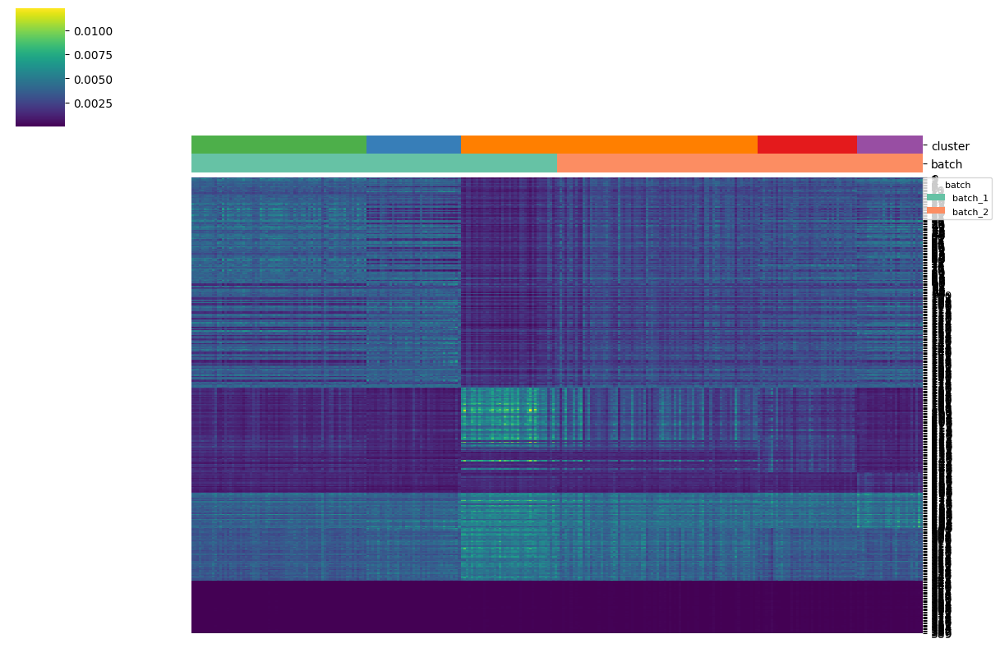

In [76]:
# Plot heatmap of Scanorama corrected data
ccd.pl.heatmap_with_annotations(adata, val=f'{output_key}_corrected_{transform_batch}', obs_keys=[state_key, batch_key], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis', 
                                pal = {'cluster': 'Set1', 'batch':'Set2'}, add_color_legend=True,
                                save_path=save_dir/f'{output_key}_{transform_batch}_corrected_heatmap_{file_suffix}.png')

Concord - INFO - UMAP embedding stored in adata.obsm['scANVI_UMAP']


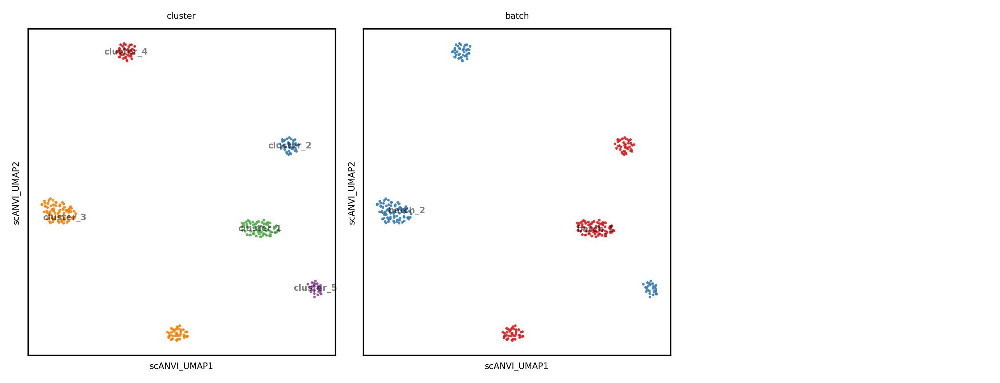

In [77]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord

In [52]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      use_decoder=False,
                      min_p_intra_domain=min_p_intra_domain,
                      domain_key=batch_key, # key indicating batch
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval

# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 288 points to 16 centroids: please provide at least 624 training points


p_intra_knn: 0.5


Epoch 0 Training: 4it [00:00, 105.10it/s, loss=4.66]
Epoch 9 Training: 100%|██████████| 4/4 [00:00<00:00, 113.80it/s, loss=4.01]


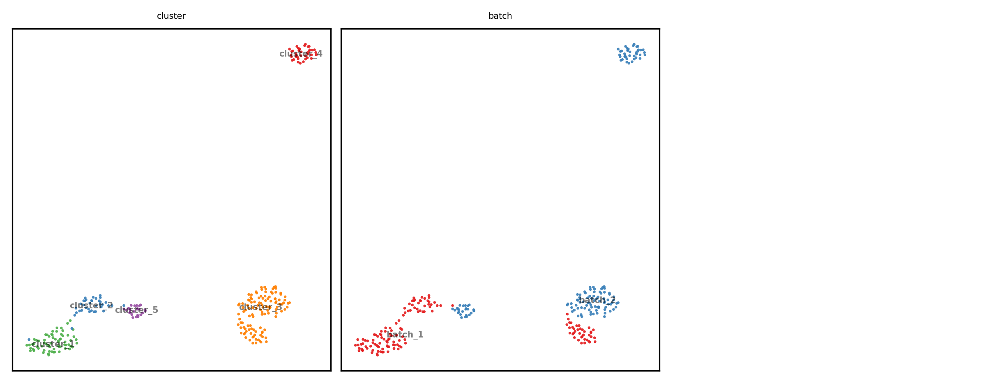

In [53]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### Concord with decoder

In [54]:
decoder_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      domain_key=batch_key, # key indicating batch
                      class_key=state_key, # key indicating class
                      use_classifier=False, # use classifier
                      use_decoder=True,
                      min_p_intra_domain=min_p_intra_domain,
                      domain_embedding_dim=8,
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

output_key = 'Concord-decoder'
with timer:
    decoder_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(decoder_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")


Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 288 points to 16 centroids: please provide at least 624 training points


p_intra_knn: 0.5


Epoch 0 Training: 4it [00:00, 63.68it/s, loss=13.9]
Epoch 9 Training: 100%|██████████| 4/4 [00:00<00:00, 94.91it/s, loss=9.18]


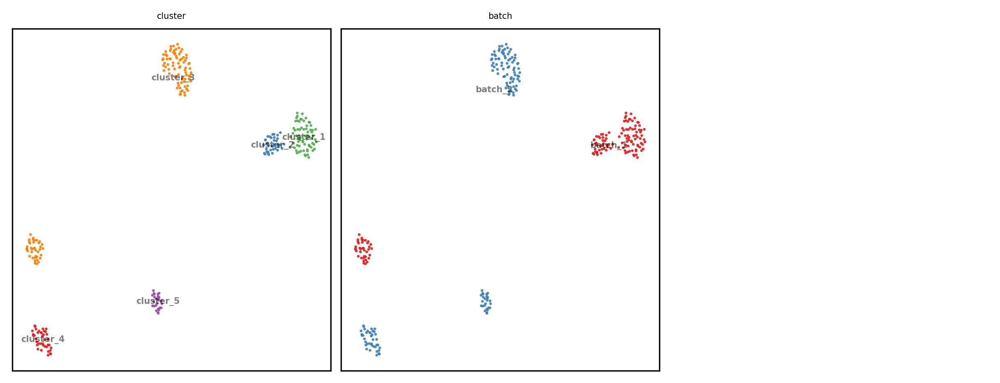

In [55]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [56]:
# Predict and store the results
decoder_domains = adata.obs[batch_key].unique()
for domain in decoder_domains:
    _, decoded, _, _, _, _ = decoder_ccd.predict(decoder_ccd.loader, return_decoded=True, decoder_domain=domain, return_class=True, return_class_prob=True)
    save_key = f"{output_key}_decoded_{domain}"
    adata.layers[save_key] = decoded

adata.layers

Layers with keys: Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2, Liger_corrected, Scanorama_corrected, counts, no_noise, scANVI_corrected_batch_1, scVI_corrected_batch_1, wt_noise

### Concord with classifier

In [57]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      min_p_intra_domain=min_p_intra_domain,
                      domain_key=batch_key, # key indicating batch
                      class_key=state_key, # key indicating class
                      use_classifier=True, # use classifier
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord-class'
with timer:
    cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
    
time_log[output_key] = timer.interval
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


WARNING clustering 288 points to 16 centroids: please provide at least 624 training points


p_intra_knn: 0.5


Epoch 0 Training: 4it [00:00, 88.44it/s, loss=6.65]
Epoch 9 Training: 100%|██████████| 4/4 [00:00<00:00, 92.69it/s, loss=4.75]


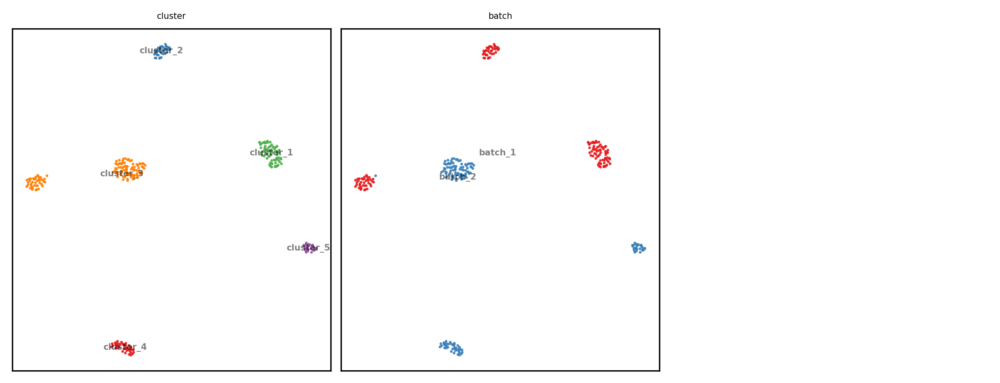

In [58]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=10, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [65]:
adata.obsm['Unintegrated'] = adata.obsm['X_pca']
n_pc=30
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=n_pc, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=n_pc, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm

AxisArrays with keys: Concord, Concord-class, Concord-class_UMAP, Concord-decoder, Concord-decoder_UMAP, Concord_PCA, Concord_UMAP, Concord_UMAP_2D, Harmony, Harmony_UMAP, Liger, Liger_UMAP, Scanorama, Scanorama_UMAP, Unintegrated, X_pca, X_umap, scANVI, scANVI_UMAP, scVI, scVI_UMAP, Concord_sorted, Concord-decoder_sorted, PCA_no_noise, PCA_wt_noise

In [66]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI", "scANVI", "Concord", 'Concord-decoder', "Concord-class"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = ground_keys + latent_keys 

In [67]:
# Run umap and PCA for all latent embeddings
for basis in combined_keys:
    print("Running UMAP and PCA for", basis)
    if basis not in adata.obsm:
        continue
    #if 'UMAP' not in basis:
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.5, metric='euclidean', random_state=seed)
    if 'PCA' not in basis:
        n_pc = min(adata.obsm[basis].shape[1], adata.shape[0]) - 1
        ccd.ul.run_pca(adata, source_key=basis, result_key=f'{basis}_PCA', n_pc=n_pc, random_state=seed)


Running UMAP and PCA for PCA_no_noise
Running UMAP and PCA for PCA_wt_noise
Running UMAP and PCA for Unintegrated
Running UMAP and PCA for Scanorama
Running UMAP and PCA for Liger
Running UMAP and PCA for Harmony
Running UMAP and PCA for scVI
Running UMAP and PCA for scANVI
Running UMAP and PCA for Concord
Running UMAP and PCA for Concord-decoder
Running UMAP and PCA for Concord-class


In [73]:
adata.write_h5ad(data_dir / f"adata_{file_suffix}.h5ad")
adata_state.write_h5ad(data_dir / f"adata_state_{file_suffix}.h5ad")
file_suffix

'Dec03-1059'

Plotting PAGA embeddings
Coloring by cluster
Concord - ERROR - Error plotting PAGA for PCA_no_noise: mismatching number of index arrays for shape; got 0, expected 2
Concord - ERROR - Error plotting PAGA for PCA_wt_noise: sparse array length is ambiguous; use getnnz() or shape[0]
Concord - ERROR - Error plotting PAGA for scANVI: mismatching number of index arrays for shape; got 0, expected 2


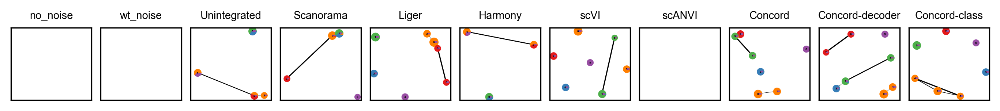

Coloring by batch
Concord - ERROR - Error plotting PAGA for PCA_no_noise: mismatching number of index arrays for shape; got 0, expected 2
Concord - ERROR - Error plotting PAGA for PCA_wt_noise: sparse array length is ambiguous; use getnnz() or shape[0]
Concord - ERROR - Error plotting PAGA for scANVI: mismatching number of index arrays for shape; got 0, expected 2


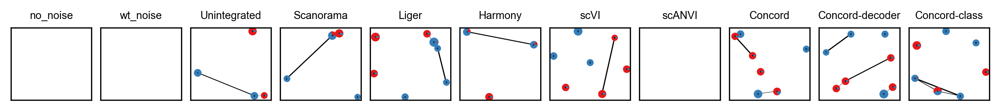

Plotting KNN embeddings
Coloring by cluster


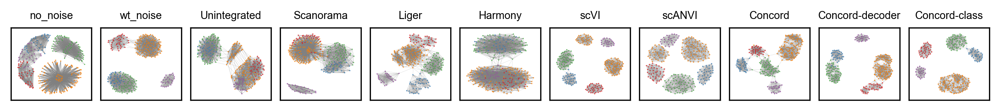

Coloring by batch


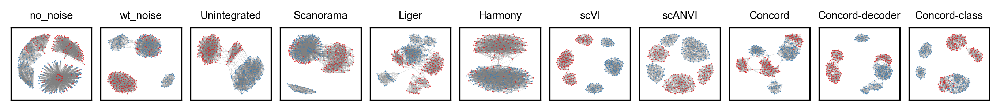

Plotting PCA embeddings
Coloring by cluster


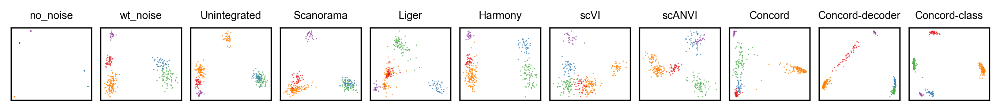

Coloring by batch


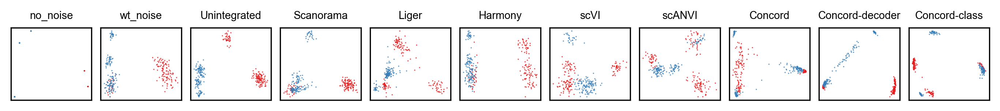

Plotting UMAP embeddings
Coloring by cluster


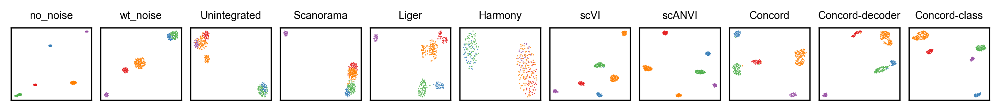

Coloring by batch


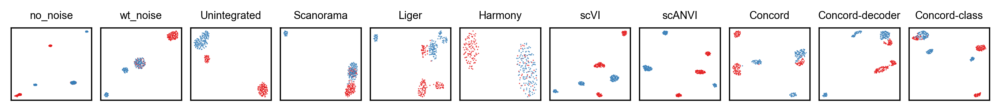

In [69]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd

color_bys = [state_key, batch_key]
basis_types = ['PAGA', 'KNN', 'PCA', 'UMAP']

font_size=7
point_size=2.5
alpha=0.8
figsize=(9,0.9)
ncols = 11
nrows = int(np.ceil(len(combined_keys) / ncols))
pal = {'state':'tab10', 'batch':'Set1'}
k=15
edges_color='grey'
edges_width=0.05
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        combined_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        leiden_key='leiden', 
        save_dir=save_dir,
        file_suffix=file_suffix,
        save_format='svg'
    )


In [70]:
adata.layers['no_noise'] = np.zeros_like(adata.X)
adata.layers['wt_noise'] = np.zeros_like(adata.X)
# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()
adata.layers['wt_noise'][:, adata_indices] = adata_state.layers['wt_noise'][:, adata_state_indices].copy()

# sort and smooth the signal along the path
#batch_id=adata.obs['batch'].unique()[0]
cell_order = np.arange(adata.n_obs)
_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord', path=cell_order, sigma=2)
adata.obsm['Concord_sorted'] = adata.obsm['Concord'][:, feature_order]

_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord-decoder', path=cell_order, sigma=2)
adata.obsm['Concord-decoder_sorted'] = adata.obsm['Concord-decoder'][:, feature_order]

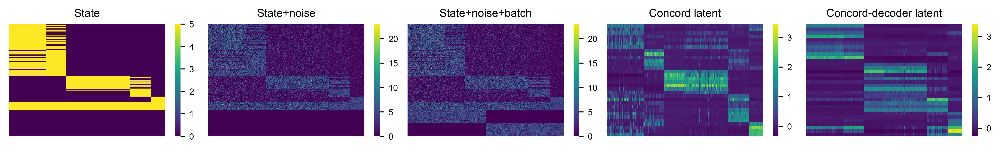

In [71]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
dpi = 600
with plt.rc_context(rc=custom_rc):
    fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
    ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    ccd.pl.heatmap_with_annotations(adata, val='Concord-decoder_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord-decoder latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
    plt.tight_layout(w_pad=0.0, h_pad=0.1)
    plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

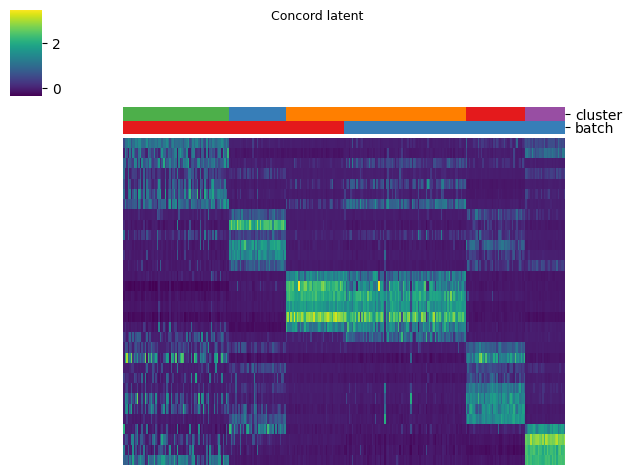

In [72]:
adata_time_sorted = adata[cell_order]
ccd.pl.heatmap_with_annotations(adata_time_sorted, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=True, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', 
                                save_path=save_dir/f'Concord_sorted_heatmap_{file_suffix}.svg', figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)

# Evaluation

In [ ]:
# adata = sc.read(data_dir / f"adata_Nov15-1812.h5ad")
# adata_state = sc.read(data_dir / f"adata_state_Nov15-1812.h5ad")

adata = sc.read(data_dir / f"adata_Dec03-1059.h5ad")
adata_state = sc.read(data_dir / f"adata_state_Dec03-1059.h5ad")

### Scib

In [74]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=state_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

Embeddings:   0%|          | 0/9 [00:00<?, ?it/s]WARNING:jax._src.xla_bridge:An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  11%|█         | 1/9 [00:07<01:02,  7.75s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  22%|██▏       | 2/9 [00:09<00:28,  4.13s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  33%|███▎      | 3/9 [00:10<00:17,  2.87s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  44%|████▍     | 4/9 [00:12<00:12,  2.41s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  56%|█████▌    | 5/9 [00:13<00:07,  1.85s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  67%|██████▋   | 6/9 [00:14<00:04,  1.52s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  78%|███████▊  | 7/9 [00:15<00:03,  1.61s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings:  89%|████████▉ | 8/9 [00:16<00:01,  1.36s/it]

INFO     cluster_1 consists of a single batch or is too small. Skip.                                               
INFO     cluster_2 consists of a single batch or is too small. Skip.                                               
INFO     cluster_4 consists of a single batch or is too small. Skip.                                               
INFO     cluster_5 consists of a single batch or is too small. Skip.                                               


Embeddings: 100%|██████████| 9/9 [00:17<00:00,  1.96s/it]


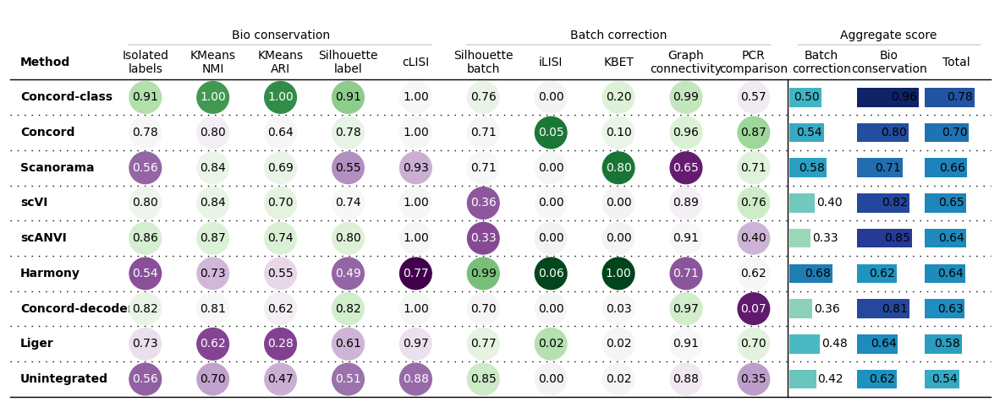

In [75]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

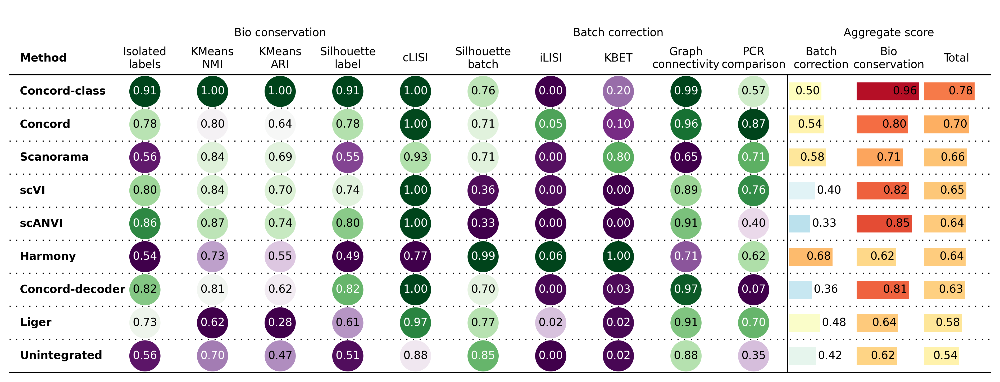

In [76]:
scib_scores = bm.get_results(min_max_scale=False)
# Convert row 'Metric Type' to multi-index column, first level is 'Metric Type', second level is existing column name
metric_type = scib_scores.loc['Metric Type']
scib_scores = scib_scores.drop('Metric Type')  # Drop the last row now that it's stored in metric_type
scib_scores.columns = pd.MultiIndex.from_tuples([(metric_type[col], col) for col in scib_scores.columns])
scib_scores = ccd.ul.benchmark_stats_to_score(scib_scores, min_max_scale=False, one_minus=False, aggregate_score=False, rank=True, rank_col=('Aggregate score', 'Total'), name_exact=False)

ccd.pl.plot_benchmark_table(scib_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', save_path=save_dir / f"scib_results_{file_suffix}.pdf", figsize=(16, 6), dpi=300)

### Topology

Run topological analysis pipeline:

In [78]:
homology_dimensions = [0,1,2]
#concord_keys = ['Concord', 'Concord-decoder', 'Concord-class']
diagrams = {}
for key in combined_keys:
#for key in concord_keys:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for PCA_no_noise
Computing persistent homology for PCA_wt_noise
Computing persistent homology for Unintegrated
Computing persistent homology for Scanorama
Computing persistent homology for Liger
Computing persistent homology for Harmony
Computing persistent homology for scVI
Computing persistent homology for scANVI
Computing persistent homology for Concord
Computing persistent homology for Concord-decoder


Computing persistent homology for Concord-class


In [79]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"

PosixPath('../save/dev_simulation_cluster_overlap-Dec03/topology_diagrams_Dec03-1059.pkl')

In [ ]:
import pickle
with open(Path('../save/dev_simulation_cluster_overlap-Dec03/topology_diagrams_Dec03-1059.pkl', 'rb')) as f:
    diagrams = pickle.load(f)

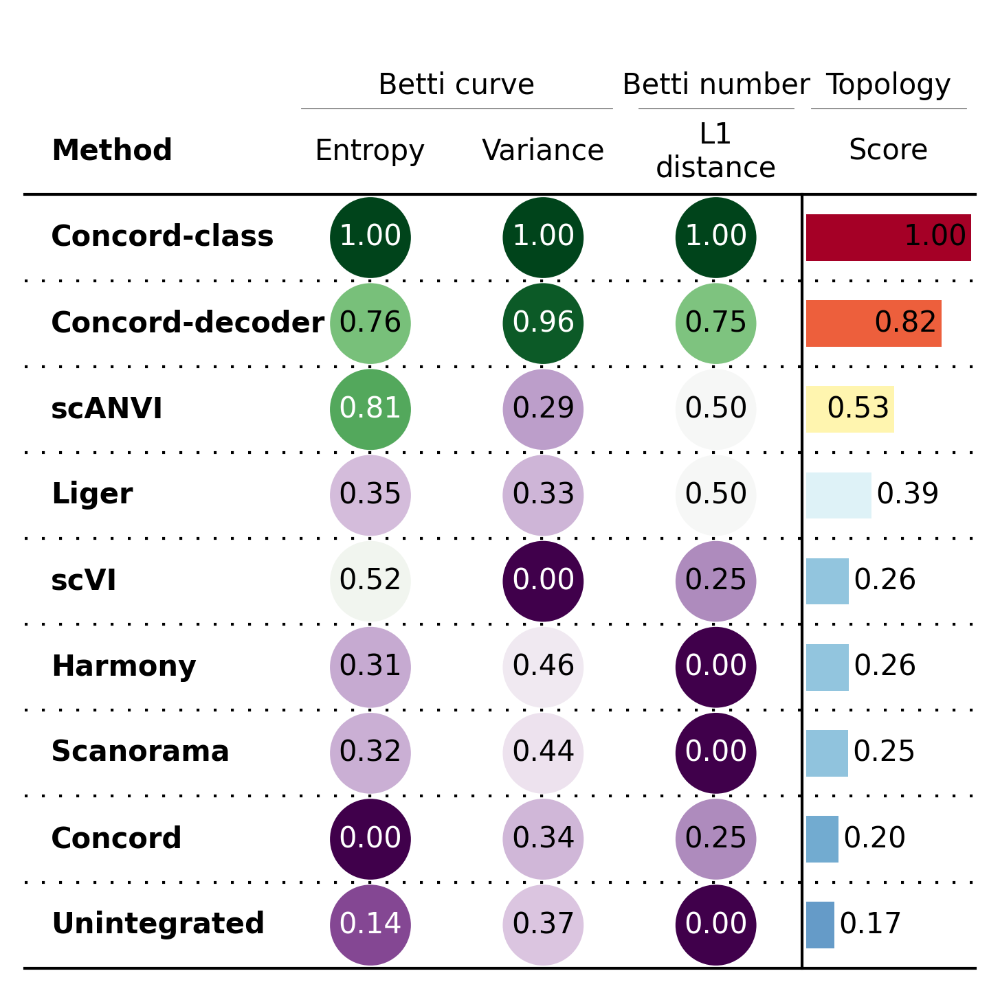

In [80]:
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=[4,0,0], save_dir=save_dir, file_suffix=file_suffix)
max_betti = 5
topology_metrics = topology_results['combined_metrics'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=5)
agg_name1 = 'Topology'
agg_name2 = 'Score'
topology_scores = ccd.ul.benchmark_stats_to_score(topology_metrics, min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 6), dpi=300)

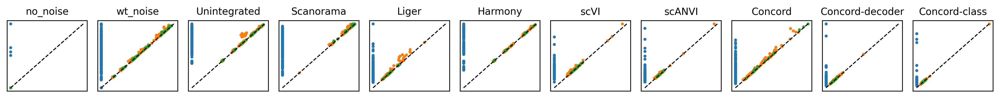

In [82]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('PCA_', ''): diagrams_ordered[key] for key in diagrams_ordered}
ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=11, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

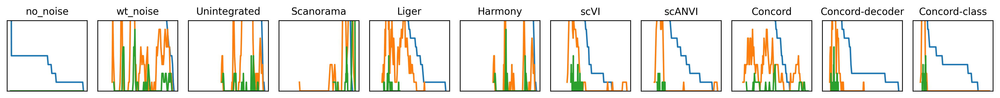

In [83]:
ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=11, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

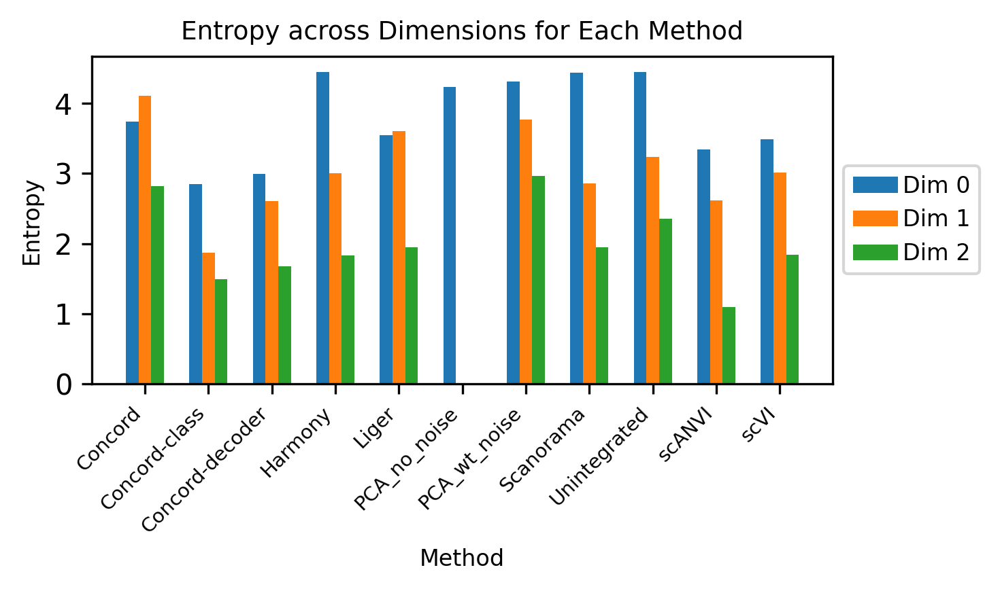

In [96]:
ccd.pl.plot_betti_statistic(topology_results['betti_stats'], statistic='Entropy', pal='tab10',
                            figsize=(5, 3), dpi=300, 
                             save_path=save_dir / f"betti_entropy_{file_suffix}.pdf")

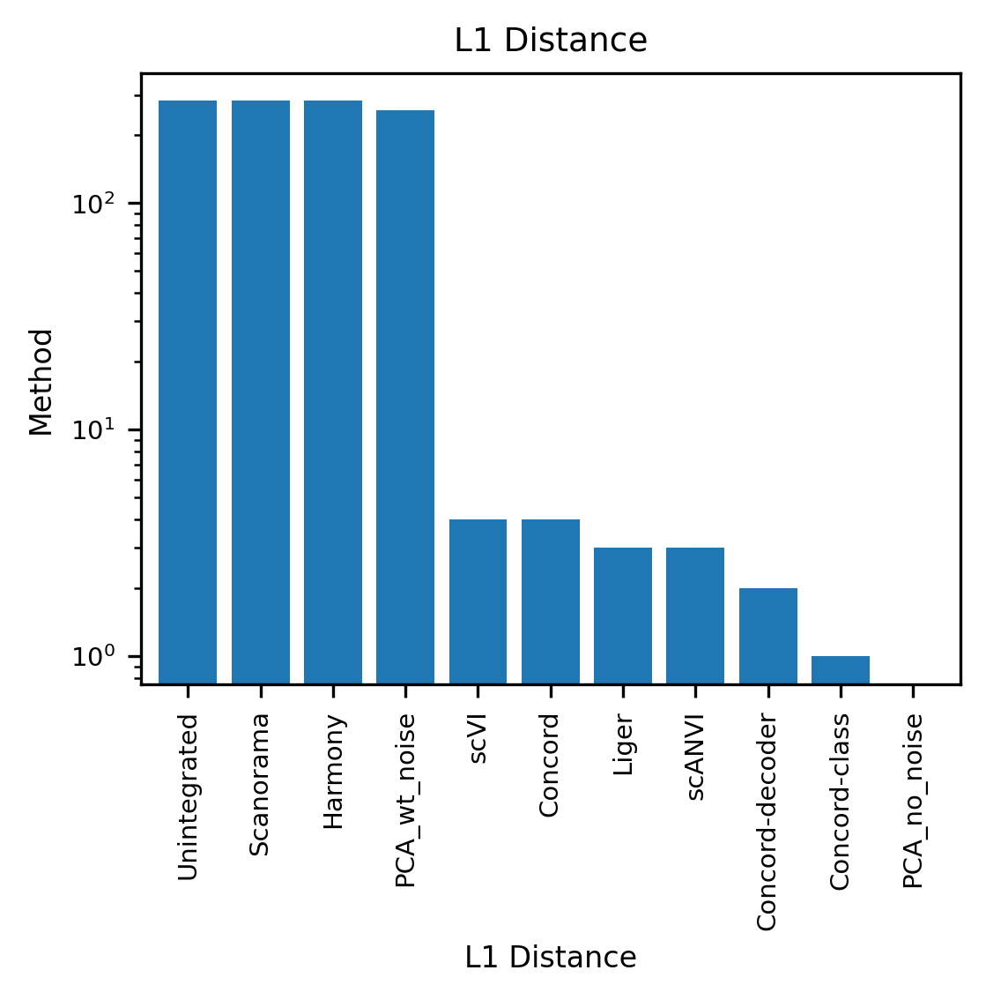

In [97]:
ccd.pl.plot_bar(
    topology_results['distance_metrics'], 
    key = 'L1 Distance',
    order=True, ascending=False, barh=False, legend=False,
    xlabel_fontsize=8, ylabel_fontsize=8, 
    log_scale=True,
    tick_fontsize=7, title_fontsize=9, bar_width=0.8,
    figsize=(4, 3), dpi=300, 
    save_path=save_dir / f"distance_metrics_{file_suffix}.pdf"
)

knn graph:

Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsisten

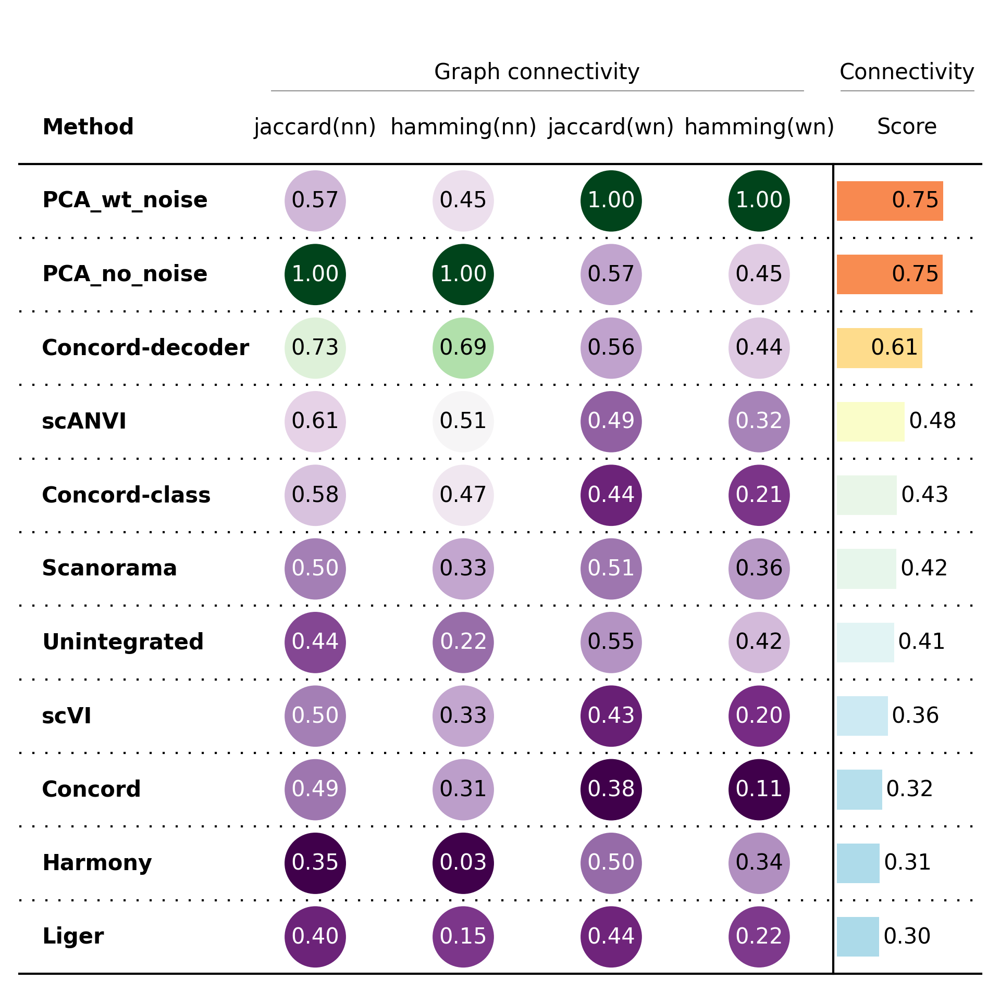

In [87]:
# compare connectivity for latent vs ground truth, store the result in a pandas dataframe
groundtruth_keys = {'(nn)': 'PCA_no_noise','(wn)': 'PCA_wt_noise'}
connectivity_df = ccd.ul.benchmark_graph_connectivity(adata, emb_keys=combined_keys, groundtruth_keys=groundtruth_keys, k=100, use_faiss=False)
agg_name1 = 'Connectivity'
agg_name2 = 'Score'
connectivity_scores = ccd.ul.benchmark_stats_to_score(connectivity_df, min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(connectivity_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"connectivity_results_{file_suffix}.pdf", figsize=(8, 8), dpi=300)


# Geomtric Features 

### Integrated benchmark pipeline

In [94]:
geometry_metrics = ['cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr', 'state_batch_distance_ratio']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
#groundtruth_key = 'PCA_wt_noise'

groundtruth_key = 'PCA_no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      state_key = state_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

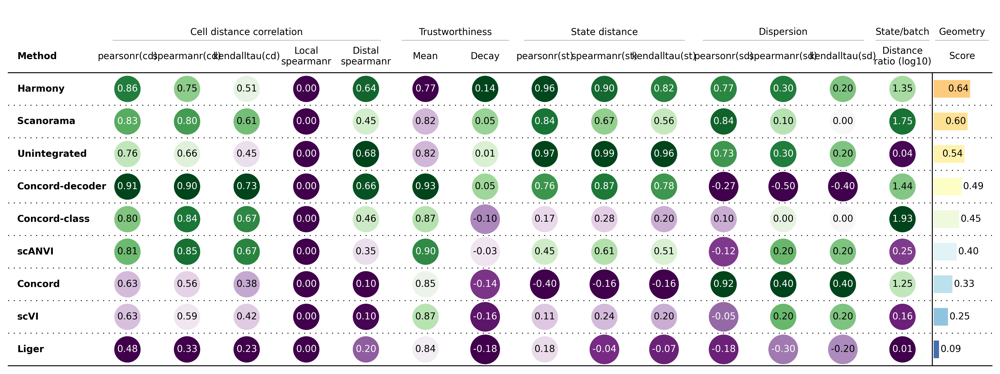

In [95]:
agg_name1 = 'Geometry'
agg_name2 = 'Score'
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=['PCA_no_noise', 'PCA_wt_noise']), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(19, 7), dpi=300)

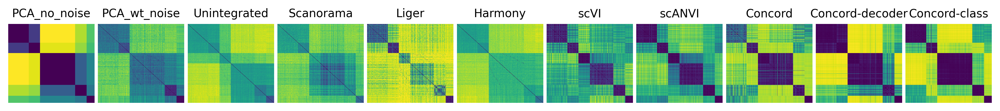

In [90]:
ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 11, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.svg")

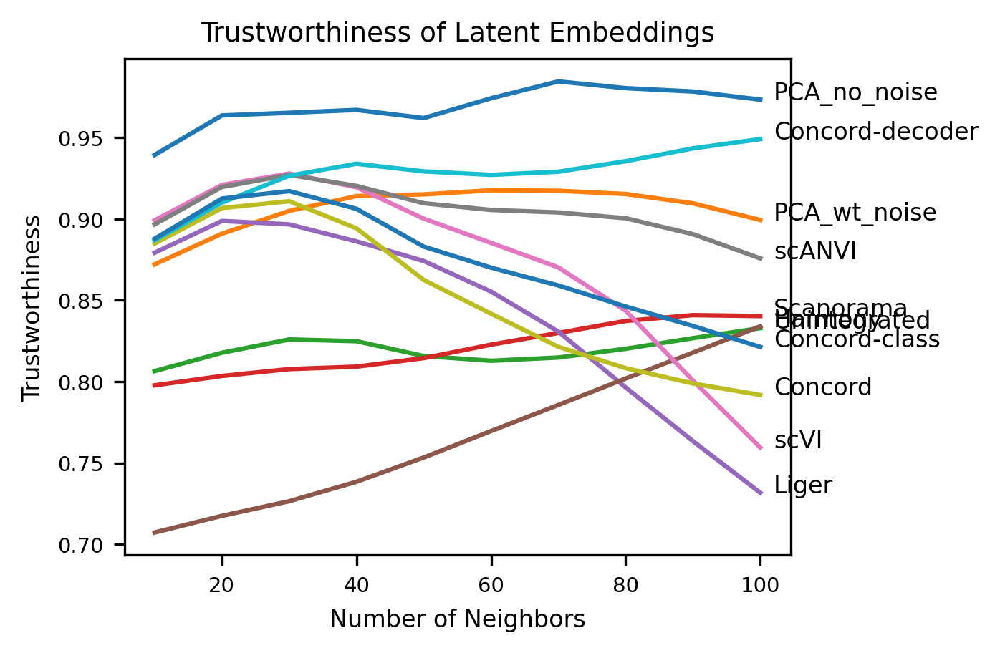

In [96]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=False, save_path=save_dir / f"trustworthiness_{groundtruth_key}_{file_suffix}.pdf", figsize=(4,3))

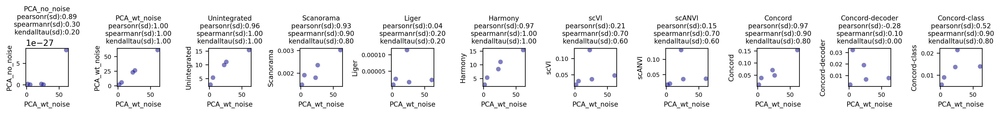

In [92]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_dispersion_corr']['dispersion'], 
    correlation= geometry_full['state_dispersion_corr']['correlation'],
    s=30, c='darkblue',
    ground_key = groundtruth_key,
    n_cols = 11, figsize=(1.5,2.0), dpi=300, save_path=save_dir / f"state_dispersion_scatter_{groundtruth_key}_{file_suffix}.pdf")